# Импорт библиотек

In [1]:
# Для загрузки и анализа данных 
import numpy as np 
import pandas as pd 
import os
import glob
import xml.etree.ElementTree as et
import shutil
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn import preprocessing
import yaml

# Для работы с изображениями и построения модели
import torchvision
from torchvision import transforms, datasets, models
import torch
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.faster_rcnn import fasterrcnn_resnet50_fpn
import PIL
from PIL import Image, ImageShow
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import albumentations as A
from albumentations.pytorch.transforms import ToTensor
import cv2


In [2]:
#Подключаем данные на гугл-диске
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Задача**

**Сравнить два типа детекторов изображений (одноуровневые и двухуровневые). Будем использовать предобученные модели Faster R-CNN и YOLOv5.** 

# 1. Faster R-CNN

## Для начала работы загрузим изображения в даталоадер

In [3]:
# путь к файлам
images_dir = '/content/drive/MyDrive/folder/archive/images/'
annotations_dir = '/content/drive/MyDrive/folder/archive/annotations/'


class FaceMaskDataset(torch.utils.data.Dataset):

    def __init__(self, images_dir, annotation_dir,width, height, transforms=None):
        self.transforms = transforms
        self.images_dir = images_dir
        self.annotation_dir = annotation_dir
        self.height = height
        self.width = width
        
        # сортировка изображений
        self.imgs = [image for image in sorted(os.listdir(images_dir))]
        self.annotate = [image for image in sorted(os.listdir(annotation_dir))]
        
        # на нулевой позиции - фон
        self.classes = [_, 'without_mask','with_mask','mask_weared_incorrect']

    def __getitem__(self, idx):

        img_name = self.imgs[idx]
        image_path = os.path.join(self.images_dir, img_name)

        # изменение цвета и размера изображения    
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)
        # нормализация изображения
        img_res /= 255.0
        
        # аннотация
        annot_filename = self.annotate[idx]
        annot_file_path = os.path.join(self.annotation_dir, annot_filename)
        
        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()
        
        # высота и ширина изобрадения
        wt = img.shape[1]
        ht = img.shape[0]
        
        # ограничивающие рамки
        for member in root.findall('object'):
            labels.append(self.classes.index(member.find('name').text))
            
            # bounding box
            xmin = int(member.find('bndbox').find('xmin').text)
            xmax = int(member.find('bndbox').find('xmax').text)
            
            ymin = int(member.find('bndbox').find('ymin').text)
            ymax = int(member.find('bndbox').find('ymax').text)
            
            
            xmin_corr = (xmin/wt)*self.width
            ymin_corr = (ymin/ht)*self.height

        #Фиксим ошибку ограничивающих рамок, выпадающих за пределы изображения
            if xmax <= wt:
              xmax_corr = (xmax/wt)*self.width
            else:
              xmax_corr = (wt/wt)*self.width

            if ymax <= ht:
              ymax_corr = (ymax/ht)*self.height
            else:
              ymax_corr = (ht/ht)*self.height
            
            boxes.append([xmin_corr, ymin_corr, xmax_corr, ymax_corr])
        
        #Перевод boxes в формат torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        
        labels = torch.as_tensor(labels, dtype=torch.int64)


        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd

        image_id = torch.tensor([idx])
        target["image_id"] = image_id


        if self.transforms:
            
            sample = self.transforms(image = img_res,
                                     bboxes = target['boxes'],
                                     labels = labels)
            
            img_res = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])
            
            
            
        return img_res, target

    def __len__(self):
        return len(self.imgs)


# проверка датасета
dataset = FaceMaskDataset(images_dir, annotations_dir, 224, 224)
print('length of dataset = ', len(dataset), '\n')

img, target = dataset[10]
print('Image shape = ', img.shape, '\n','Target - ', target)

length of dataset =  853 

Image shape =  (224, 224, 3) 
 Target -  {'boxes': tensor([[ 90.0465, 107.5200, 157.7674, 174.7200]]), 'labels': tensor([2]), 'area': tensor([4550.8472]), 'iscrowd': tensor([0]), 'image_id': tensor([10])}


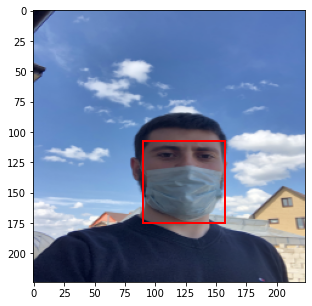

In [4]:
# Вспомогательная функция для визуализации bbox

def plot_img_bbox(img, target):
    fig, a = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    a.imshow(img)
    for box in (target['boxes']):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        # Отрисуем bbox поверх картинки
        a.add_patch(rect)
    plt.show()
    
img, target = dataset[10]
plot_img_bbox(img, target)

In [5]:
def get_transform(train):
    
    if train:
        return A.Compose([
                            A.HorizontalFlip(0.5),
                            A.ToGray(p=0.3),
                            #A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
                            ToTensor() 
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
                            ToTensor()
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
        
def collate_fn(batch):
  return tuple(zip(*batch))

In [6]:
dataset = FaceMaskDataset(images_dir, annotations_dir, 480, 480, transforms= get_transform(train=True))
dataset_test = FaceMaskDataset(images_dir, annotations_dir, 480, 480, transforms= get_transform(train=False))

# разделим данные на train и test
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()

test_split = 0.2
tsize = int(len(dataset)*test_split)
dataset = torch.utils.data.Subset(dataset, indices[:-tsize])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-tsize:])

data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=10, shuffle=True,
    collate_fn=collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=10, shuffle=False,
    collate_fn=collate_fn)

print(f'Размер обучающего датасета: {len(dataset)}')
print(f'Размер тестового датасета: {len(dataset_test)}')

Размер обучающего датасета: 683
Размер тестового датасета: 170


# Обучение модели

Работать будем с предобученной моделью на базе ResNet50, заменив классификатор на выходе. Модель достаточно легковесна.

In [7]:
def get_model_instance_segmentation(num_classes):
    model = fasterrcnn_resnet50_fpn(pretrained=True)
   #число входных признаков для классификатора
    in_features = model.roi_heads.box_predictor.cls_score.in_features
   #меняем классификатор на новый
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
train_loss = []
loss_list = []
num_classes = 4

model = get_model_instance_segmentation(num_classes)

num_epochs = 15

model.to(device)


params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.01,
                                momentum=0.9, weight_decay=0.0005)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)
len_dataloader = len(data_loader)

for epoch in range(num_epochs):
    model.train()
    i = 0    
    epoch_loss = 0
    for imgs, annotations in tqdm(data_loader):
        i += 1
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())
        train_loss.append(losses.item())        
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        epoch_loss = np.mean(train_loss)
    loss_list.append(epoch_loss)
    print('Epoch_loss = ',epoch_loss)


100%|██████████| 69/69 [02:18<00:00,  2.00s/it]


Epoch_loss =  0.5351245953984882


100%|██████████| 69/69 [02:21<00:00,  2.05s/it]


Epoch_loss =  0.436141739828863


100%|██████████| 69/69 [02:21<00:00,  2.06s/it]


Epoch_loss =  0.3868371028687067


100%|██████████| 69/69 [02:22<00:00,  2.06s/it]


Epoch_loss =  0.3534574084577785


100%|██████████| 69/69 [02:21<00:00,  2.06s/it]


Epoch_loss =  0.3293863362376241


100%|██████████| 69/69 [02:22<00:00,  2.06s/it]


Epoch_loss =  0.30902295184416184


100%|██████████| 69/69 [02:22<00:00,  2.06s/it]


Epoch_loss =  0.2922831153261859


100%|██████████| 69/69 [02:22<00:00,  2.06s/it]


Epoch_loss =  0.27742412905681174


100%|██████████| 69/69 [02:22<00:00,  2.07s/it]


Epoch_loss =  0.2650517398332532


100%|██████████| 69/69 [02:21<00:00,  2.06s/it]


Epoch_loss =  0.25450591933576094


100%|██████████| 69/69 [02:22<00:00,  2.06s/it]


Epoch_loss =  0.24405902553452805


100%|██████████| 69/69 [02:21<00:00,  2.06s/it]


Epoch_loss =  0.23452233912306275


100%|██████████| 69/69 [02:22<00:00,  2.06s/it]


Epoch_loss =  0.2265807237131407


100%|██████████| 69/69 [02:22<00:00,  2.06s/it]


Epoch_loss =  0.21915034422994153


100%|██████████| 69/69 [02:22<00:00,  2.06s/it]

Epoch_loss =  0.21247278643403075


In [ ]:
#Сохраняем обученную модель
torch.save(model, '/content/drive/MyDrive/folder/archive/mask_model_1.pth')

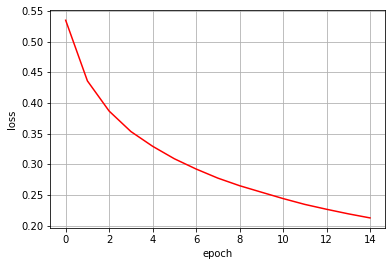

In [ ]:
#Процесс обучения
fig = plt.figure()
plt.plot(loss_list, color = 'red')

plt.ylabel('loss')
plt.xlabel('epoch')

plt.grid(True)

plt.show()

На данном этапе для экономии ресурсов в колабе переключаемся с gpu на cpu. Дальнейшие вычисления будем проводить на процессоре

In [8]:
#Загружаем обученную модель
model = torch.load('/content/drive/MyDrive/folder/archive/mask_model_1.pth', map_location='cpu')

## Оценка модели

In [9]:
# вспомогательная функция принимает исходный прогноз и порог iou

def get_nms(orig_prediction, thresh):


  kp = torchvision.ops.nms(orig_prediction['boxes'],
                           orig_prediction['scores'],
                           thresh)
  prediction = orig_prediction
  prediction['boxes'] = prediction['boxes'][kp]
  prediction['scores'] = prediction['scores'][kp]
  prediction['labels'] = prediction['labels'][kp]
    
  return prediction 


# преобразование в изображение
def torch_to_pil(img):
  return transforms.ToPILImage()(img).convert('RGB')


# считаем iou
def bb_intersection_over_union(box1, box2):

  #определяем x,y - координаты прямоугольника
  x1 = max(box1[0], box2[0])
  y1 = max(box1[1], box2[1])
  x2 = min(box1[2], box2[2])
  y2 = min(box1[3], box2[3])

  #вычисляем площадь пересечения прямоугольников
  interArea = max(0, x2 - x1 + 1) * max(0, y2 - y1 +1)

  #вычисляем площади предсказанных и истинных прямоугольников
  box1Area = (box1[2] - box1[0] +1) * (box1[3] - box1[1] +1)
  box2Area = (box2[2] - box2[0] +1) * (box2[3] - box2[1] +1)

  #вычисляем iou
  iou = interArea / float(box1Area + box2Area - interArea)

  return iou 

In [17]:
#Проверим работу модели на одном изображении
img, target = dataset_test[1]

model.eval()
model.to('cpu')
with torch.no_grad():
    prediction = model([img])[0]
    
print('predicted #boxes: ', len(prediction['labels']))
print('real #boxes: ', len(target['labels']))

predicted #boxes:  9
real #boxes:  9


target


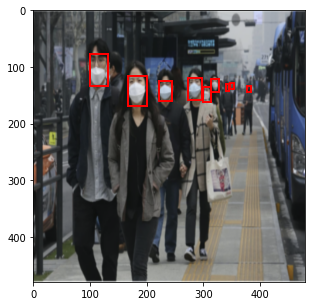

In [11]:
print('target')
plot_img_bbox(torch_to_pil(img), target)

prediction


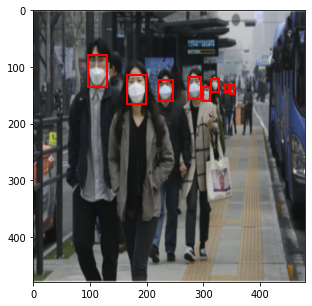

In [12]:
print('prediction')
plot_img_bbox(torch_to_pil(img), prediction)

prediction with nms


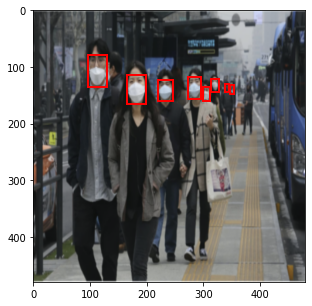

In [19]:
nms_prediction = get_nms(prediction, 0.5)
print('prediction with nms')
plot_img_bbox(torch_to_pil(img), nms_prediction)

In [20]:
#Делаем предсказание на тестовом датасете
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
val_loss = []
iou_max_list = []
tp, fp, fn = 0, 0, 0
preds = []

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.01)
                                

for imgs, annotations in tqdm(data_loader_test):

  optimizer.zero_grad()

  imgs = list(img.to(device) for img in imgs)
  annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]

  model.eval()
  with torch.no_grad():
    predictions = model(imgs, annotations)
    for prediction in predictions:
      preds.append(get_nms(prediction, 0.5))

100%|██████████| 17/17 [16:02<00:00, 56.65s/it]


In [21]:
#Вернём списки с изображениями и аннотациями
targets = []
imgs = []
for img, target in dataset_test:
  targets.append(target)
  imgs.append(img)
  

#Проверка
len(targets) == len(preds)

True

In [22]:
#Цель
targets[0]

{'area': tensor([ 3279.1011, 11498.4277,  5501.1260,  2211.2366,  6053.3950,   582.4720,
           440.0897,  1087.2811,   232.9884]),
 'boxes': tensor([[210.0000,  98.8764, 258.0000, 167.1910],
         [  9.6000, 303.8202,  87.6000, 451.2360],
         [152.4000, 332.5843, 213.6000, 422.4719],
         [318.0000, 332.5843, 348.0000, 406.2921],
         [384.0000, 357.7528, 439.2000, 467.4157],
         [318.0000, 285.8427, 336.0000, 318.2022],
         [390.0000, 257.0786, 410.4000, 278.6517],
         [394.8000, 303.8202, 420.0000, 346.9663],
         [379.2000, 262.4719, 390.0000, 284.0450]]),
 'image_id': tensor([204]),
 'iscrowd': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0]),
 'labels': tensor([2, 2, 2, 2, 2, 2, 2, 3, 2])}

In [23]:
#Предсказание
preds[0]

{'boxes': tensor([[379.7087, 360.0754, 437.9767, 470.4694],
         [157.2647, 332.0465, 210.0376, 423.6507],
         [210.5060, 103.5157, 253.0726, 166.0447],
         [392.9136, 256.5801, 410.1464, 280.4601],
         [378.7079, 265.5162, 390.3258, 285.8210],
         [  6.6248, 307.4254,  83.7183, 446.4197],
         [318.5435, 349.0865, 345.5476, 403.9750],
         [315.2101, 293.3302, 330.7411, 315.7324]]),
 'labels': tensor([2, 2, 2, 2, 2, 2, 2, 2]),
 'scores': tensor([0.9993, 0.9991, 0.9988, 0.9979, 0.9932, 0.9907, 0.9903, 0.7020])}

In [51]:
#Вычисление iou
fn = 0
tp = 0
fp = 0
for i in range(len(preds)):
  #Считаем количество предсказанных и истинных рамок
    num_preds = len(preds[i]['boxes'])
    num_annot = len(targets[i]['boxes'])

    if num_preds < num_annot:
      num1 = num_preds
      num2 = num_annot
      ind = 1

    else:
      num2 = num_preds
      num1 = num_annot
      ind = 2

  #Истинную рамку сравниваем с каждой предсказанной
    for j in range(num1):
      iou_list = []

      if ind == 1:
        box1, box2 = preds[i]['boxes'], targets[i]['boxes']
      else:
        box2, box1 = preds[i]['boxes'], targets[i]['boxes']

      for k in range(num2):
        iou = bb_intersection_over_union(box1[j], box2[k])

        iou_list.append(iou)
    #И берём лучший вариант
      iou_max = max(iou_list)
  
      if iou_max > 0.5:
        if ind == 1:
    #Метки совпадают - верное предсказание       
          if preds[i]['labels'][j] == targets[i]['labels'][iou_list.index(iou_max)]:
            tp += 1
    
          else:
            fn += 1
    
        else:
          if targets[i]['labels'][j] == preds[i]['labels'][iou_list.index(iou_max)]:
            tp += 1
          else:
            fn += 1
    #Метки совпадают, но ниже порога
      else:
        if ind == 2:
          if targets[i]['labels'][j] == preds[i]['labels'][iou_list.index(iou_max)]:
            fp += 1
          else:
            fn += 1

      

      iou_max_list.append(iou_max)

In [52]:
tp, fp, fn

(877, 33, 70)

# Отрисовка изображений

In [ ]:
def plot_image(img_tensor, annotation,predict=True):
    
    fig,ax = plt.subplots(1)
    fig.set_size_inches(18.5, 10.5)

    img = img_tensor.detach().numpy()
    
    img = np.ascontiguousarray(img)

    img = img.transpose((1,2,0)).data

    mask_dic = {1:'without_mask', 2:'with_mask', 3:'mask_weared_incorrect'}

    ax.imshow(img)
    
    for i,box in enumerate(annotation["boxes"]):
        xmin, ymin, xmax, ymax = box

        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='r',facecolor='none')

        ax.add_patch(rect)
        label = mask_dic[int(annotation['labels'][i].data)]
        if predict:
            score = int((annotation['scores'][i].data) * 100)
            ax.text(xmin, ymin, f"{label} : {score}%", horizontalalignment='center', verticalalignment='center',fontsize=20,color='b')
        else:
            score=''
            ax.text(xmin, ymin, f"{label}", horizontalalignment='center', verticalalignment='center',fontsize=20,color='b')
    plt.show()


Prediction
Target


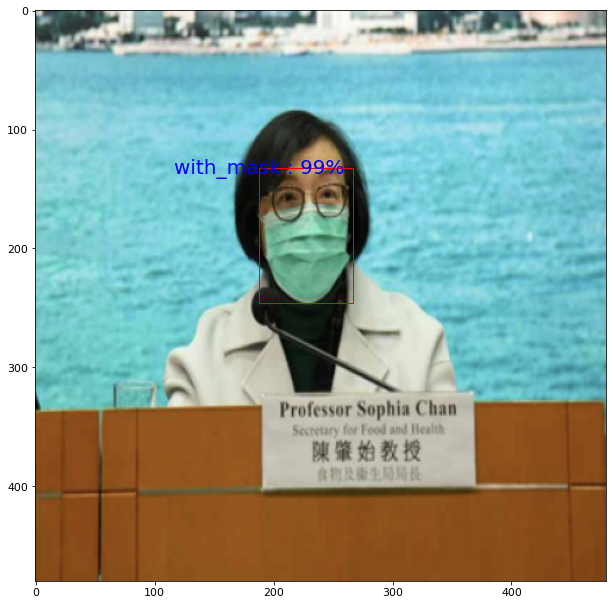

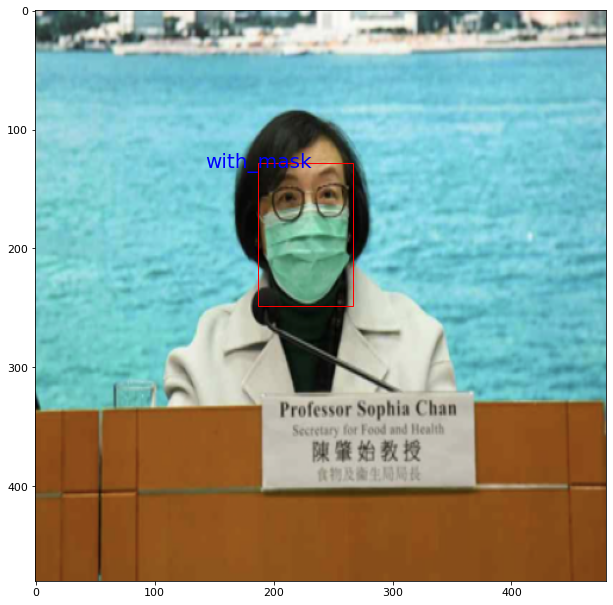

In [ ]:
nms_prediction = preds[20]
print("Prediction")
plot_image(imgs[20], nms_prediction)
print("Target")
plot_image(imgs[20].to('cpu'), targets[20],False)

Prediction
Target


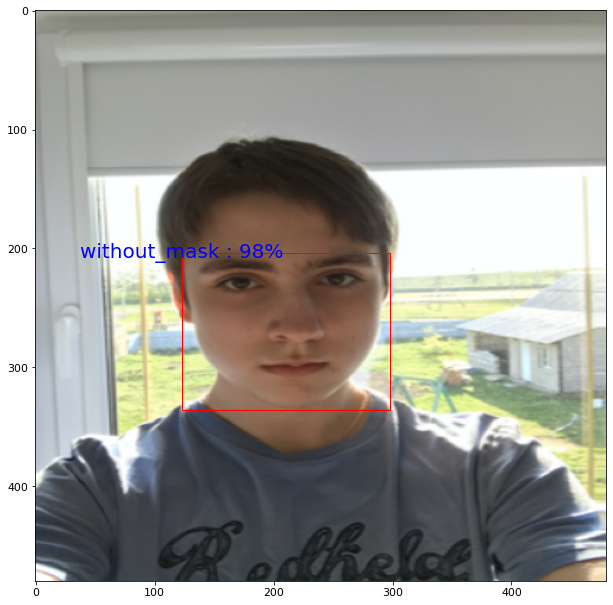

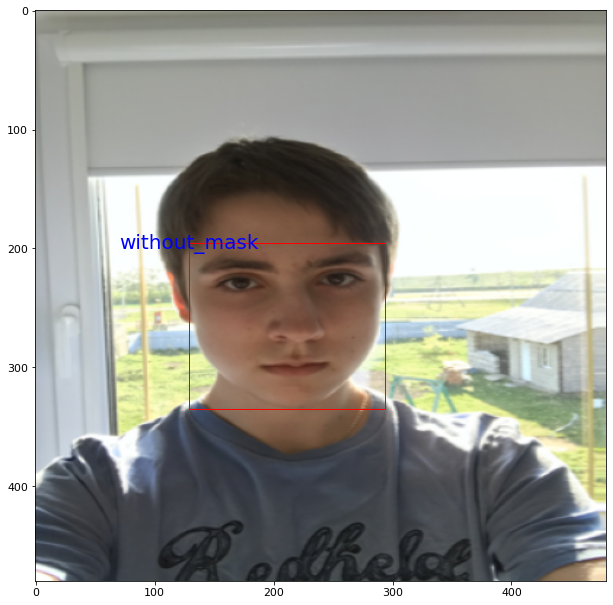

In [ ]:
nms_prediction = preds[50]
print("Prediction")
plot_image(imgs[50], nms_prediction)
print("Target")
plot_image(imgs[50].to('cpu'), targets[50],False)

Prediction


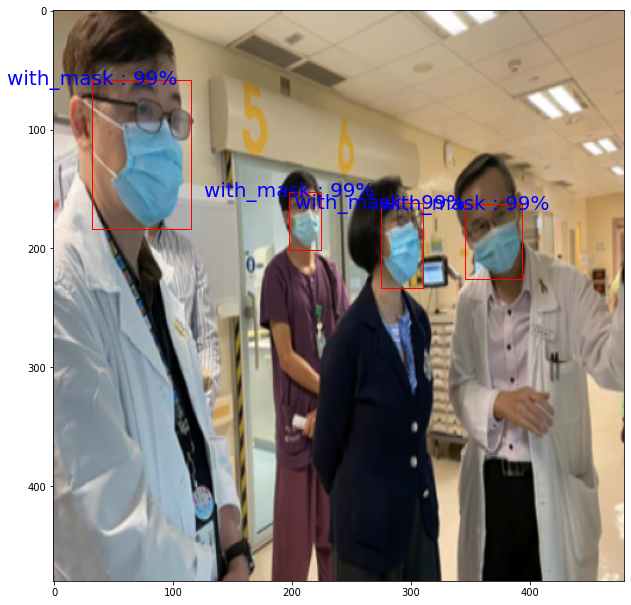

Target


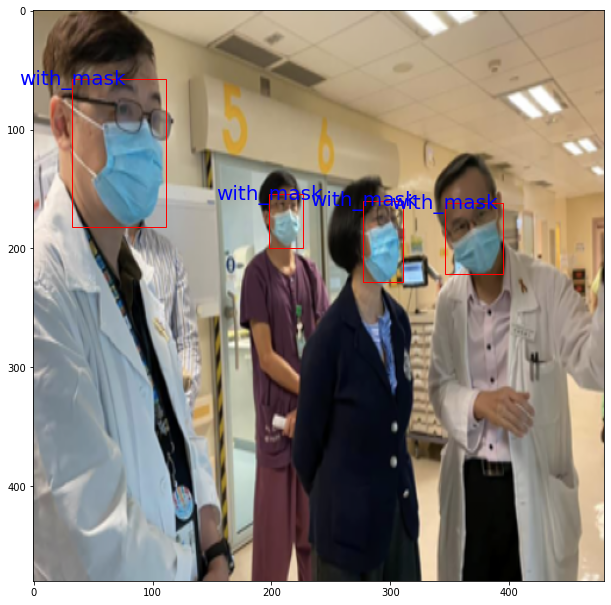

In [ ]:
nms_prediction = preds[31]
print("Prediction")
plot_image(imgs[31], nms_prediction)
print("Target")
plot_image(imgs[31].to('cpu'), targets[31],False)

Prediction


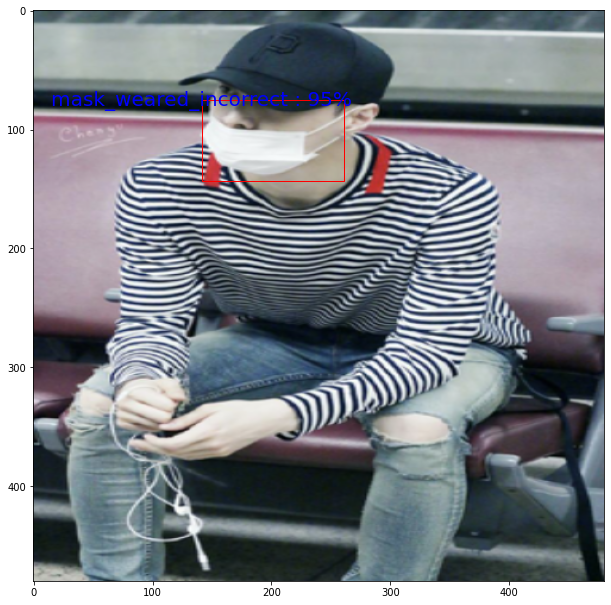

Target


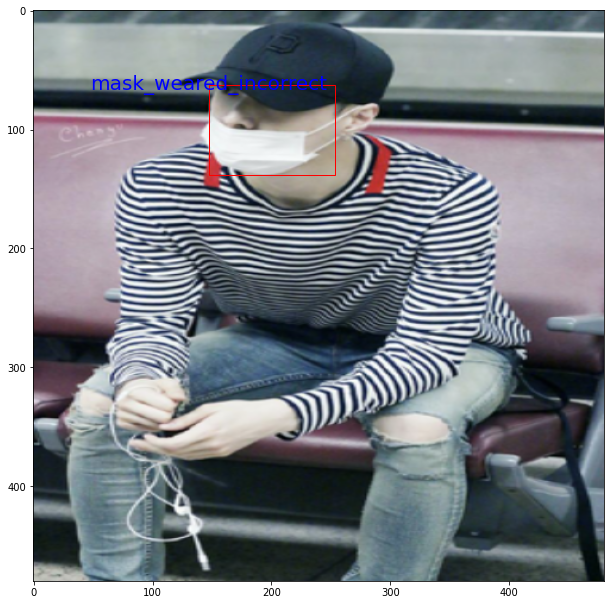

In [ ]:
nms_prediction = preds[62]
print("Prediction")
plot_image(imgs[62], nms_prediction)
print("Target")
plot_image(imgs[62].to('cpu'), targets[62],False)

Prediction


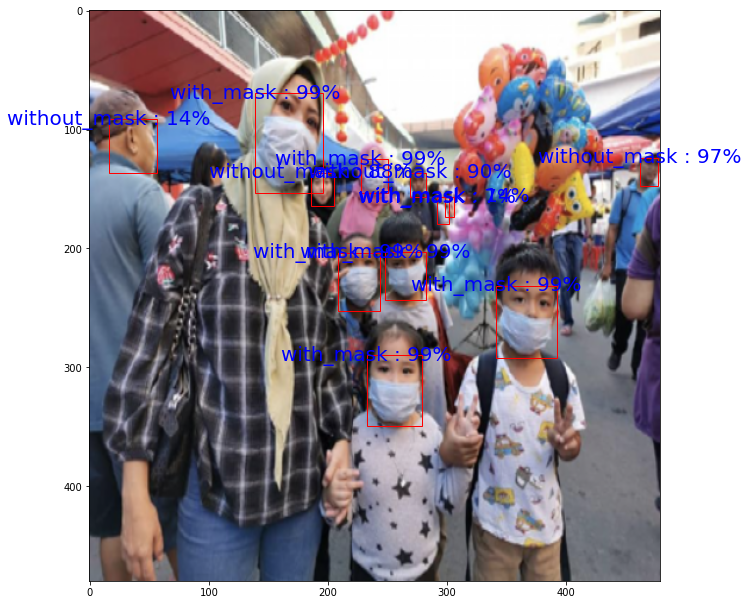

Target


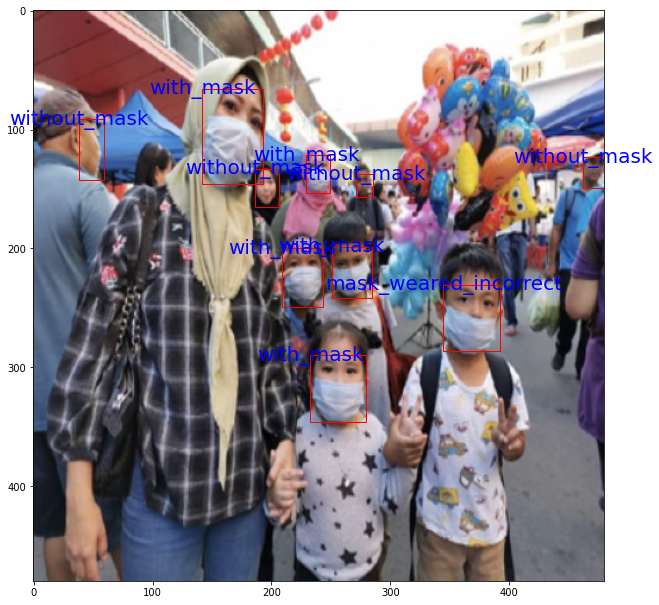

In [ ]:
nms_prediction = preds[64]
print("Prediction")
plot_image(imgs[64], nms_prediction)
print("Target")
plot_image(imgs[64].to('cpu'), targets[64],False)

На изображениях с небольшим количеством объектов модель работает отлично. На изображениях с большим количеством объектов, наряду с ложными срабатываниями, модель находит неразмеченные лица, что также будет относиться к ложному срабатыванию.  

In [43]:
precision = tp/(tp+fp)
round(precision, 4)

0.9637

In [44]:
recall = tp/(tp+fn)
round(recall, 4)

0.9261

In [45]:
#map
res_sum = 0
for elem in iou_max_list:
  res = elem
  res_sum += res

res_sum/len(iou_max_list)

tensor(0.7493)

# 2. YOLO

In [4]:
# путь к файлам
print(images_dir)
print(annotations_dir)

/content/drive/MyDrive/folder/archive/images/
/content/drive/MyDrive/folder/archive/annotations/


Для работы необходимо преобразовать данные в YOLO-формат

In [5]:
#Записываем данные из xml в датафрейм
def xml_to_csv(path = annotations_dir):
    xml_list = []
    for xml_file in tqdm(glob.glob(path + '/maksssksksss*.xml')):
        tree = et.parse(xml_file)
        root = tree.getroot()
        for obj in root.findall('object'):
            bbx = obj.find('bndbox')
            xmin = int(bbx.find('xmin').text)
            ymin = int(bbx.find('ymin').text)
            xmax = int(bbx.find('xmax').text)
            ymax = int(bbx.find('ymax').text)
            label = obj.find('name').text

            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[2].text),
                     int(root.find('size')[1].text),
                     label,
                     xmin,
                     ymin,
                     xmax,
                     ymax
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'channels', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [6]:
xml_df = xml_to_csv()
xml_df.to_csv('Mask.csv', index=None)
print('Конвертация прошла успешно.')

100%|██████████| 853/853 [00:20<00:00, 42.24it/s] 

Конвертация прошла успешно.


Общее количество объектов 4072
Количество изображений 853


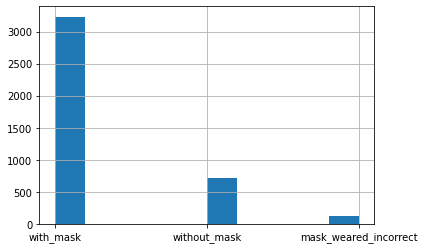

In [7]:
print(f'Общее количество объектов {xml_df.shape[0]}')
print(f'Количество изображений {len(np.unique(xml_df["filename"]))}')
xml_df.head(5)
#Заодно посмотрим на распределение классов
xml_df['class'].hist()

In [8]:
#Закодируем классы обьектов
le = preprocessing.LabelEncoder()
xml_df['class'] = le.fit_transform(xml_df['class'])

In [9]:
#Сохраним кодировку классов в переменной mapping.
mapping = dict(zip(le.classes_, range(len(le.classes_))))
mapping

{'mask_weared_incorrect': 0, 'with_mask': 1, 'without_mask': 2}

Приводим данные к формату YOLOv5.

Аннотация для каждого объекта должна быть в следующем виде:

Class X Y Width Height

In [10]:
unique_image_names = xml_df['filename'].unique()
len(unique_image_names)

853

In [11]:
#Создадим функцию для конвертации
def convert_to_yolov5(df, unique_img_names):

  #Для каждого изображения
  for i in range(xml_df['filename'].nunique()):
    print_buffer = []
    point =  xml_df[xml_df['filename'] == unique_image_names[i]]
    img_name = unique_image_names[i]

  #Для каждого уникального объекта
    for k in range(len(point)):
      class_id = point.iloc[k]['class']

  #Преобразуем координаты bbox
      X = (point.iloc[k]['xmin'] + point.iloc[k]['xmax']) / 2
      Y = (point.iloc[k]['ymin'] + point.iloc[k]['ymax']) / 2

      Width = point.iloc[k]['xmax'] - point.iloc[k]['xmin']
      Height = point.iloc[k]['ymax'] - point.iloc[k]['ymin']

  #Нормализуем координаты
      image_c = point.iloc[k]['channels']
      image_w = point.iloc[k]['width']
      image_h = point.iloc[k]['height']
      
      X /= image_w
      Y /= image_h

      Width /= image_w
      Height /= image_h

  #Запишем информацию о bbox в файл
      print_buffer.append('{} {:.3f} {:.3f} {:.3f} {:.3f}'.format(
            class_id, X, Y, Width, Height
        ))
  #Дадим имя файлам, которые хотим сохранить
    save_file_name = os.path.join(images_dir, img_name.replace('png', 'txt'))

  #Сохраним аннотации на диск
    print("\n".join(print_buffer), file = open(save_file_name, "w"))




In [12]:
# Получим аннотации в новом формате
convert_to_yolov5(xml_df, unique_image_names)

In [13]:
#Создаём 2 списка с изображениями
train_img, val_img = train_test_split(sorted(xml_df['filename'].unique()),
                                      test_size=0.2, shuffle=False)

print(f'train: {len(train_img)}')
print(f'val: {len(val_img)}')

train: 682
val: 171


В столбце "filename" находятся названия изображений. Для обучения YOLO нам необходимо разложить изображения для тренировки и валидации по соответствующим папкам.

In [14]:
#Папки для изображений и аннотаций
os.makedirs('/content/mask/images/train')
os.makedirs('/content/mask/images/val')
os.makedirs('/content/mask/labels/train')
os.makedirs('/content/mask/labels/val')

In [15]:
#Копируем изображения для тренировки в папку train

for image in list(train_img):
  shutil.copy(f'/content/drive/MyDrive/folder/archive/images/{image}',
              '/content/mask/images/train')

#Копируем изображения для валидации в папку val

for image in list(val_img):
  shutil.copy(f'/content/drive/MyDrive/folder/archive/images/{image}',
              '/content/mask/images/val')

#Списки с аннотациями
train_labels = []
val_labels = []

#Копируем аннотации в папку train
for file in train_img:
  file = file.replace('png', 'txt')
  shutil.move(f'/content/drive/MyDrive/folder/archive/images/{file}',
              '/content/mask/labels/train')
  
#Копируем аннотации в папку val
for file in val_img:
  file = file.replace('png', 'txt')
  shutil.move(f'/content/drive/MyDrive/folder/archive/images/{file}',
              '/content/mask/labels/val')

In [16]:
#Информацию о расположении датасета, количество и название классов складываем в
#yaml-файл

ya = {'path': '/content/mask/',
      'train': 'images/train',
      'val': 'images/val',
      'nc': 3,
      'names': ['mask_weared_incorrect',
                'with_mask',
                'without_mask']}

with open(r'/content/mask/data.yaml', 'w') as file:
  data = yaml.dump(ya, file)

In [17]:
#Загружаем модель
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 12393, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (47/47), done.
remote: Total 12393 (delta 33), reused 30 (delta 11), pack-reused 12335
Receiving objects: 100% (12393/12393), 12.21 MiB | 12.22 MiB/s, done.
Resolving deltas: 100% (8547/8547), done.


Используем предобученную модель YOLOv5s, самую легковесную и соответственно быструю.

In [20]:
!python /content/yolov5/train.py --batch-size 16 --epochs 30 --data /content/mask/data.yaml --weights yolov5s.pt 

train: weights=yolov5s.pt, cfg=, data=/content/mask/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-275-g29d79a6 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_

In [21]:
results = pd.read_csv('/content/yolov5/runs/train/exp2/results.csv')

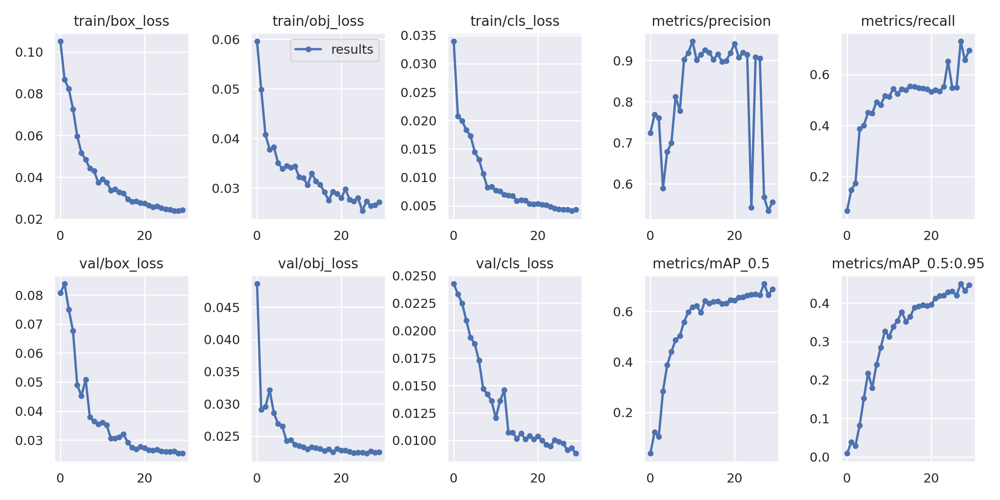

In [22]:
#Загрузим график с результатми работы
result_image = Image.open('/content/yolov5/runs/train/exp2/results.png')
display(result_image)

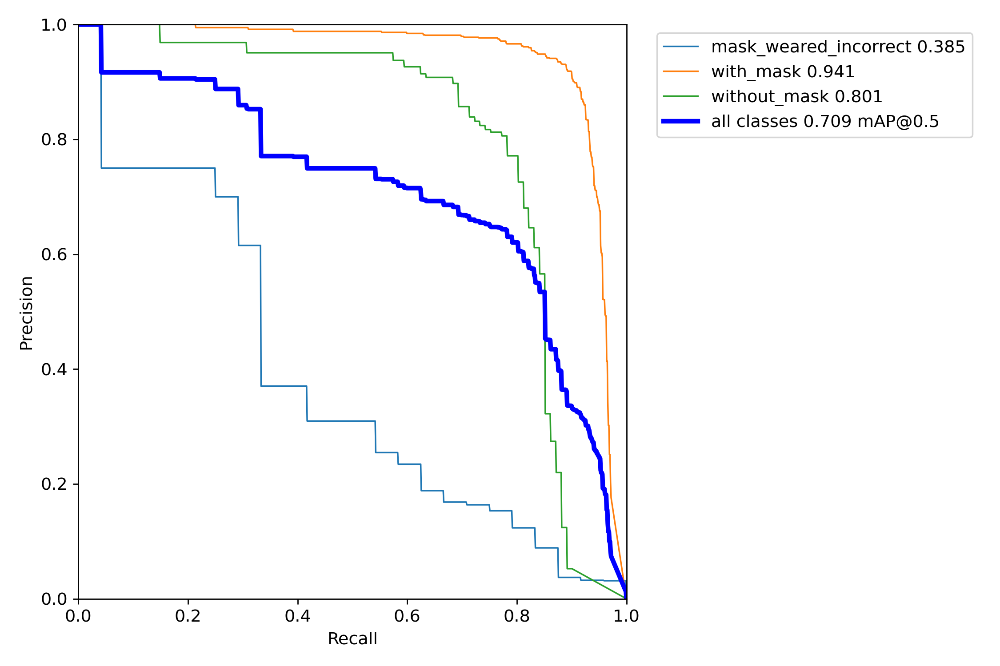

In [30]:
pr_curve = Image.open('/content/yolov5/runs/train/exp2/PR_curve.png')
display(pr_curve)

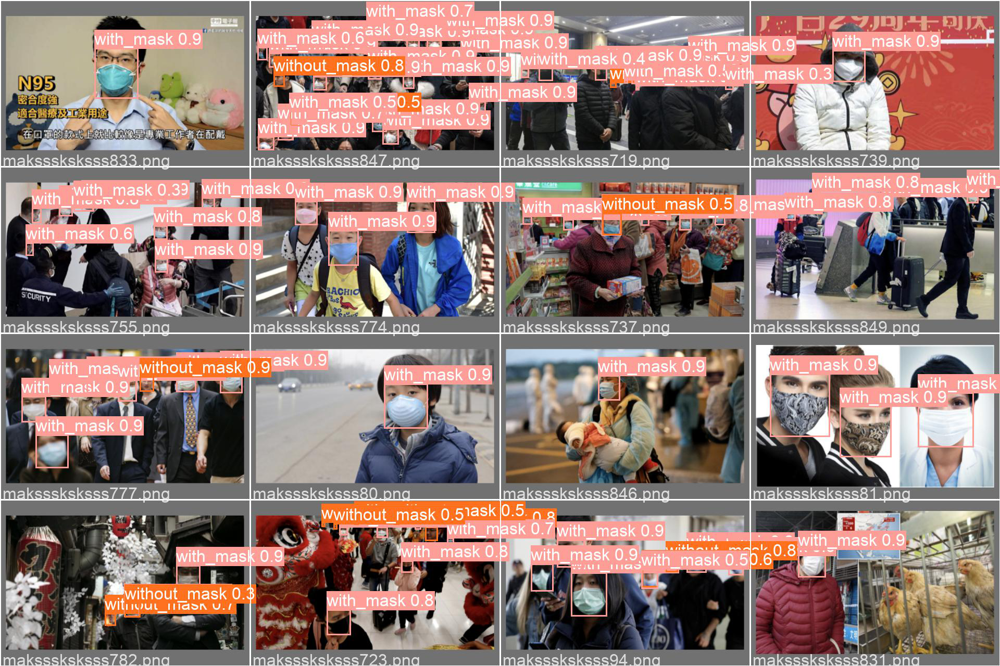

In [25]:
#Предсказания модели 
batch_image = Image.open('/content/yolov5/runs/train/exp2/val_batch1_pred.jpg')
display(batch_image)

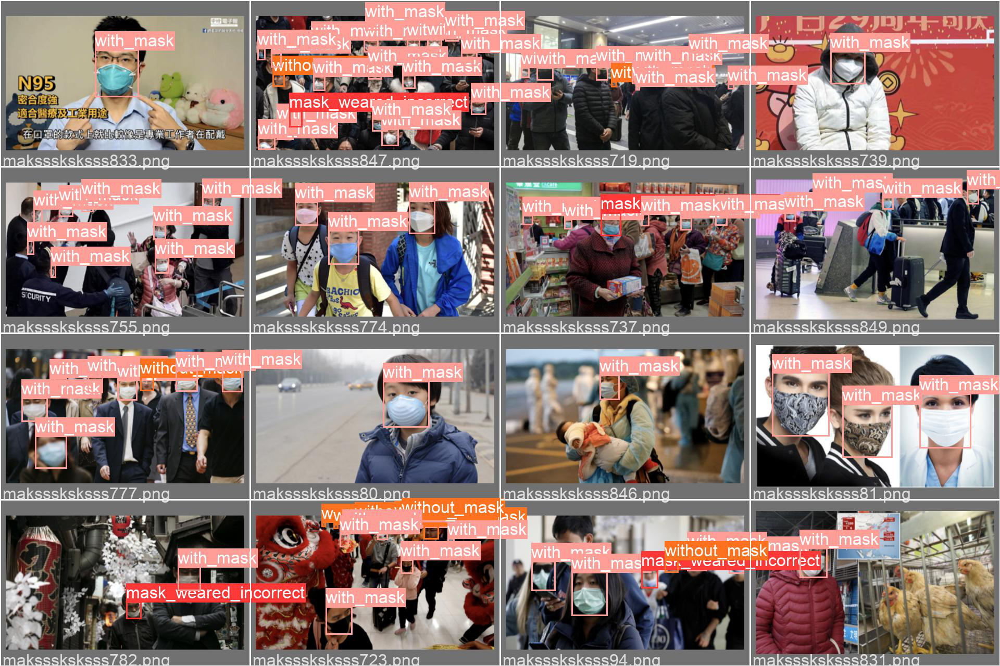

In [26]:
#Target 
batch_image = Image.open('/content/yolov5/runs/train/exp2/val_batch1_labels.jpg')
display(batch_image)

In [29]:
results.describe()

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,14.500000,0.040250,0.032527,0.009195,0.815693,0.498331,0.549657,0.315952,0.037700,0.024983,0.013277,0.008575,0.005164,0.005164
std,8.803408,0.021022,0.007255,0.006818,0.139057,0.145612,0.182864,0.134545,0.017156,0.005148,0.004719,0.013637,0.002613,0.002613
min,0.000000,0.023863,0.025356,0.004090,0.534050,0.065121,0.037201,0.009063,0.025405,0.022309,0.008814,0.000760,0.000760,0.000760
25%,7.250000,0.026176,0.027709,0.005151,0.733225,0.483513,0.516678,0.250842,0.026576,0.022587,0.010012,0.003152,0.003116,0.003116
50%,14.500000,0.032644,0.030595,0.006381,0.901815,0.538790,0.631580,0.370545,0.030586,0.023018,0.010682,0.005545,0.005215,0.005215
75%,21.750000,0.043939,0.034328,0.010078,0.915800,0.548582,0.656578,0.417075,0.037548,0.024367,0.014681,0.007938,0.007278,0.007278
max,29.000000,0.105110,0.059585,0.033944,0.947080,0.729960,0.709120,0.449980,0.083885,0.048639,0.024253,0.070698,0.009268,0.009268


In [27]:
#Сохраним обученную модель на диске
shutil.copy(f'/content/yolov5/runs/train/exp2/weights/best.pt',
              '/content/drive/MyDrive/folder/archive')

'/content/drive/MyDrive/folder/archive/best.pt'

In [19]:
#Запускаем скрипт detect.py с использованием сохранённой модели
#на изображениях для валидации, результаты сохраняем в папку detect_val
!python /content/yolov5/detect.py --source /content/mask/images/val --weights /content/drive/MyDrive/folder/archive/best.pt --iou 0.5 --name /content/detect_val

detect: weights=['/content/drive/MyDrive/folder/archive/best.pt'], source=/content/mask/images/val, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=/content/detect_val, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-275-g29d79a6 Python-3.7.13 torch-1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients
image 1/171 /content/mask/images/val/maksssksksss712.png: 640x512 1 with_mask, Done. (0.879s)
image 2/171 /content/mask/images/val/maksssksksss713.png: 480x640 1 with_mask, Done. (0.640s)
image 3/171 /content/mask/images/val/maksssksksss714.png: 480x640 5 with_masks, Done. (0.488s)
image 4/171 /content/mask/images/val/maksssksksss715.png: 640x448

In [23]:

res_path = '/content/detect_val2/'
yolo_results = sorted(os.listdir(res_path))

def show_results(num):
  result_image = Image.open(res_path + yolo_results[num])
  display(result_image)


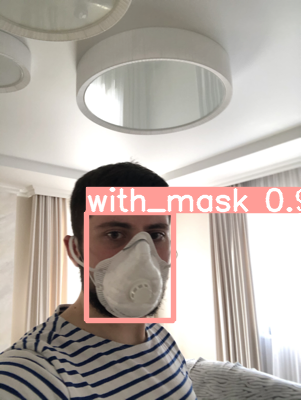

In [26]:
show_results(0)

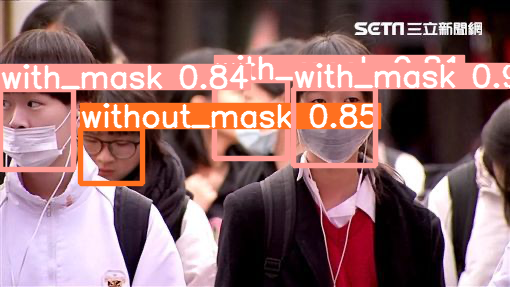

In [28]:
show_results(5)

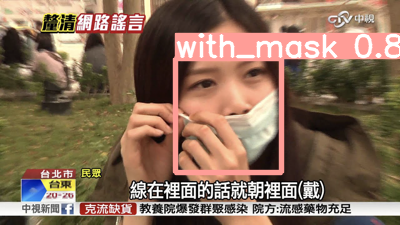

In [32]:
show_results(39)

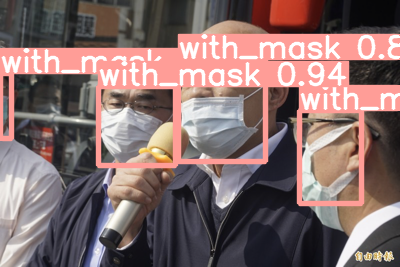

In [30]:
show_results(170)

## Вывод

В результате проведённой работы по обучению двух различных детекторов изображений можно сделать следующие выводы:

- двухступенчатые детекторы тратят больше времени как на обучение, так и на валидацию. Для получения хорошего результата требуется меньшее количество эпох обучения. map при пороге iou=0.5 составил 0,75.

- одноступенчатые детекторы быстрее учатся, проход по 170 изображениям для валидации составил 7 минут в отличии от 18 минут для двухступенчатого детектора (расчёты проводились на cpu). При этом качество детекции всё-таки ниже, даже после 30 эпох обучения map при пороге iou=0.5 составил 0,71.

Для повышения точности моделей было бы неплохо увеличить количество изображений для обучения. Также модели находят на изображениях неразмеченные лица, что фактически относится к ложным срабатываниям модели. Присутствует дисбаланс классов, особенно заметно на классе "mask_weared_incorrect", который заметно снижает точность работы модели.

Что можно сделать лучше:
- для Faster R-CNN использовать библиотеку Pytorch Lightning, с помощью Tensorboard получить доступ к логам.
- использовать fine-tuning для YOLO 


